# MAT-MEK9270 Mandatory assignment 1: Report

## 1.2.3 
We need to show that the function
$$\begin{equation}
u(t,x,y) = e^{\imath (k_x x + k_y y - \omega t)}
\end{equation}$$

satisfies the wave equation 

$$ \frac{\partial^2 u}{\partial t^2} = c^2 \nabla^2u.$$

The double time derivative of $u$ is $-\omega^2 u$, and $\nabla^2u = -(k_x^2 + k_y^2)u$.
Thus, the wave equation is satisfied, because we know from the exact solutions that $\omega^2 = c^2(k_x^2 + k_y^2)$.


## 1.2.4
Let a numerical solution be $\begin{equation}
u^n_{ij} = e^{\imath (kh(i+j) - \tilde{\omega} n\Delta t)}
\end{equation}.$

This means that $$u_{i,j}^{n\pm 1} = e^{\imath( kh(i+j) - \tilde \omega (n \pm 1) \Delta t)} = u_{i,j}^{n} e^{\mp \imath\tilde \omega \Delta t}$$ 
and 
$$u_{i \pm 1,j}^{n} = u_{i,j \pm 1}^{n} = e^{\imath (kh(i+j \pm 1) - \tilde{\omega} n\Delta t)}= u_{i,j}^{n} e^{\pm \imath kh}$$


Inserting this into
$$\begin{equation}
\frac{u^{n+1}_{i,j} - 2u^n_{i,j} + u^{n-1}_{i, j}}{\Delta t^2} =
 c^2 \left(\frac{u^n_{i+1,j} - 2u^n_{i,j} + u^n_{i-1, j}}{h^2} + \frac{u^n_{i,j+1} - 2u^n_{i,j} + u^n_{i, j-1}}{h^2}\right)
\end{equation}$$
yields
$$\begin{align*}
\frac{u_{i,j}^n (e^{-\imath \tilde \omega \Delta t} - 2 + e^{\imath \tilde \omega \Delta t})}{\Delta t^2} &= \frac{c^2}{h^2} u_{i,j}^n (e^{\imath kh} - 2 + e^{-\imath kh} + e^{\imath kh} - 2 + e^{-\imath kh})\\
u_{i,j}^n (2\frac{e^{\imath \tilde \omega \Delta t} + e^{-\imath \tilde \omega \Delta t}}{2}-2) &= CFL^2 u_{i,j}^n (4\frac{e^{\imath kh} + e^{-\imath kh}}{2} - 2)\\
\cos(\tilde \omega \Delta t) -1 &= CFL^2 2 (\cos(kh)-1)\\
\end{align*}$$

Which when letting $CFL = \frac{c \Delta t}{h} = \frac{1}{\sqrt{2}}$ gives
$$\cos(\tilde \omega \Delta t) = \cos(kh),$$

which implies that $(\tilde \omega \Delta t)^2 = (kh)^2$ (as $\cos(x) = \cos(-x)$). Noting that $(\frac{h}{\Delta t})^2 = 2c^2 $, we get that
$$(\tilde \omega)^2 = 2 k^2c^2,$$
which coincides with the exact $\omega^2 = c^2(k_x^2 + k_y^2) = 2c^2 k^2$.

## 1.2.5
Now we test if setting $m_x=m_y$ and letting $C = \frac{1}{\sqrt2}$ leads to low errors.

Smallest error is 6.870788586660982e-13


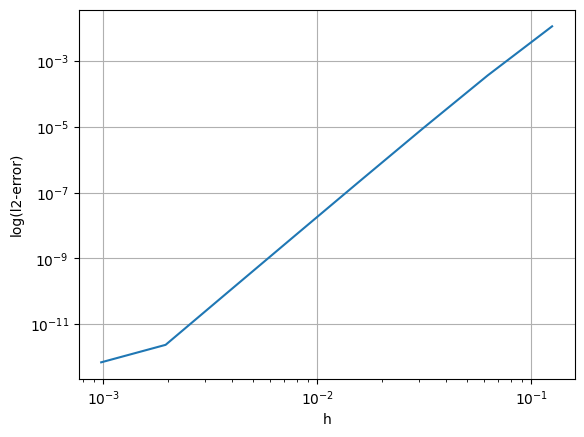

In [1]:
%run ../Wave2D.py
import numpy as np
import matplotlib.pyplot as plt
sol = Wave2D()
r, E, h = sol.convergence_rates(m=8, mx=2, my=2, Nt = 5, cfl=1/np.sqrt(2))

plt.loglog(h, E)
plt.xlabel('h')
plt.ylabel('log(l2-error)')
plt.grid()
print(f"Smallest error is {min(E)}")

We see that the error after 5 timesteps is smaller than $10^{-12}$ when $m_x = m_y = 2$.

## 1.2.5 Movie
Now we create an animated movie of a solution (using the code from lecture 7):

In [18]:
sol = Wave2D_Neumann()
data = sol(128, 128, mx=2, my=2, cfl=1/np.sqrt(2), store_data=2)
xij, yij = sol.xij, sol.yij

In [34]:
%%capture
import matplotlib.animation as animation

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
frames = []
for n, val in data.items():
    frame = ax.plot_surface(xij, yij, val, cmap=cm.viridis, vmin=-1.0, vmax= 1.0)
    frames.append([frame])

ani = animation.ArtistAnimation(fig, frames, interval=400, blit=True,
                                repeat_delay=1000)

In [35]:
ani.save('neumannwave.gif', writer='pillow', fps=25) # This animated png opens in a browser

In [36]:
from IPython.display import HTML
from IPython.display import display
display(HTML(ani.to_jshtml()))